In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
x = load('/kaggle/input/coco-2017-dataset/coco2017/val2017/000000000785.jpg')
print(x.shape)

(425, 640, 3)


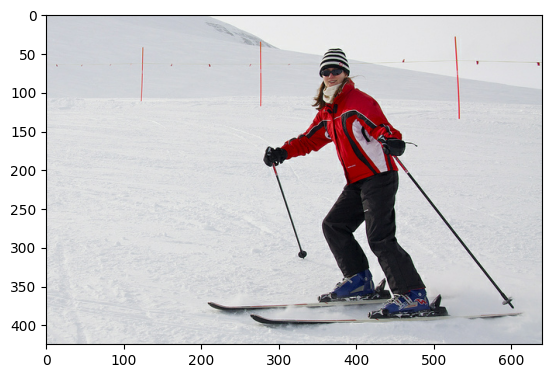

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

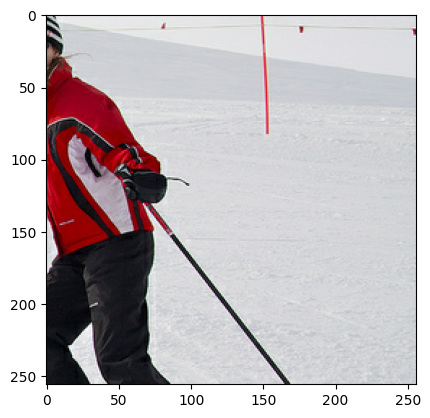

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

In [14]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

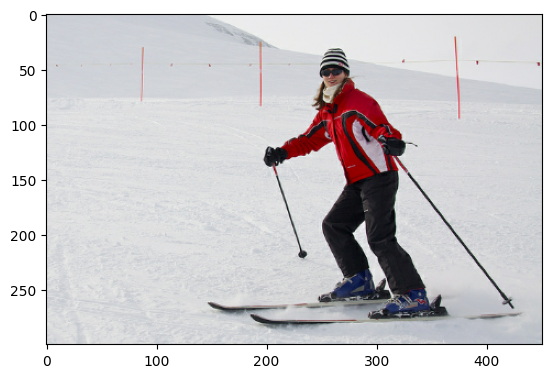

In [15]:
x = resize_with_aspect_ratio(x,300)
plt.imshow(x/255)

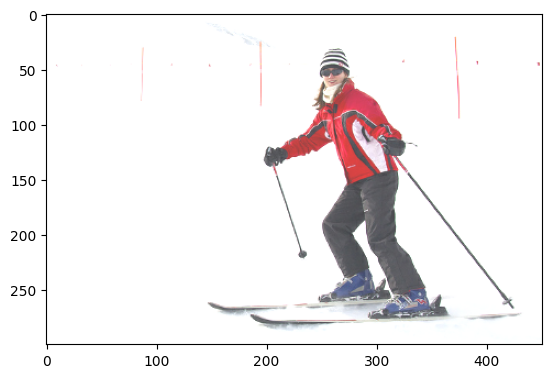

In [16]:
x_brightness = tf.image.random_brightness(x, 75)
plt.imshow(x_brightness/255)

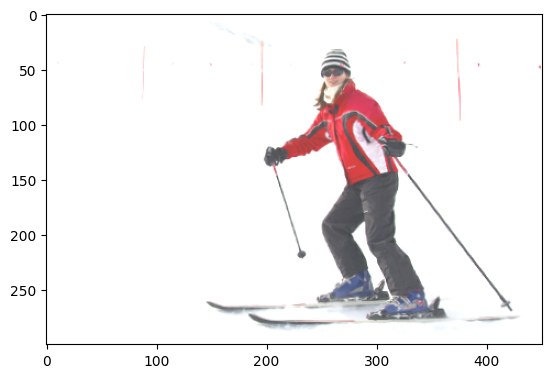

In [17]:
# Define the rotation angle in radians
rotation_angle = tf.random.uniform(shape=(), minval=-tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), maxval=tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), dtype=tf.float32)

# Apply the rotation using tfa.image.rotate
x_rotated = tfa.image.rotate(x_brightness, angles=rotation_angle,interpolation='bilinear', fill_mode='nearest')
plt.imshow(x_rotated/255)

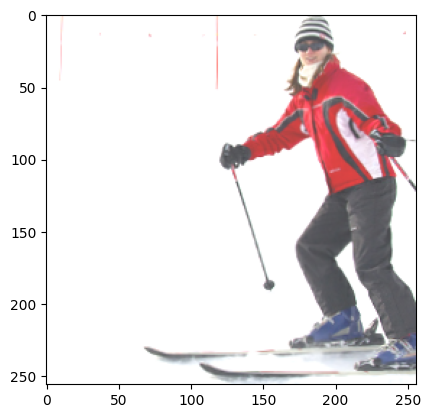

In [18]:
x_aug = random_crop(x_rotated)
plt.imshow(x_aug/255.0)

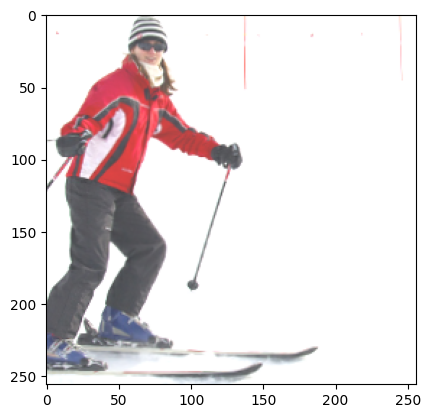

In [19]:
x_jitter = random_jitter(x_aug)
plt.imshow(x_jitter/255.0)

In [20]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 300)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 75)
    # Define the rotation angle in radians
    rotation_angle = tf.random.uniform(shape=(), minval=-tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), maxval=tf.constant(30.0 * (3.141592653589793 / 180.0), dtype=tf.float32), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle,interpolation='bilinear', fill_mode='nearest')
    real_image = random_crop(real_image)
    

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [21]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [22]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [23]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files('/kaggle/input/coco-2017-dataset/coco2017/train2017/*')
train_dataset = train_dataset.shuffle(10,reshuffle_each_iteration=True)
train_dataset = train_dataset.take(32000)
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset.cardinality().numpy()

2000

In [24]:
# create input pipeline
val = tf.data.Dataset.list_files('/kaggle/input/coco-2017-dataset/coco2017/val2017/*')
val = val.take(1000)
val = val.map(load_test_image)
val = val.shuffle(10).batch(BATCH_SIZE)
val.cardinality().numpy()

63

In [25]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [26]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 150, 226, 3)


In [27]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 300, 452, 3)


In [28]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

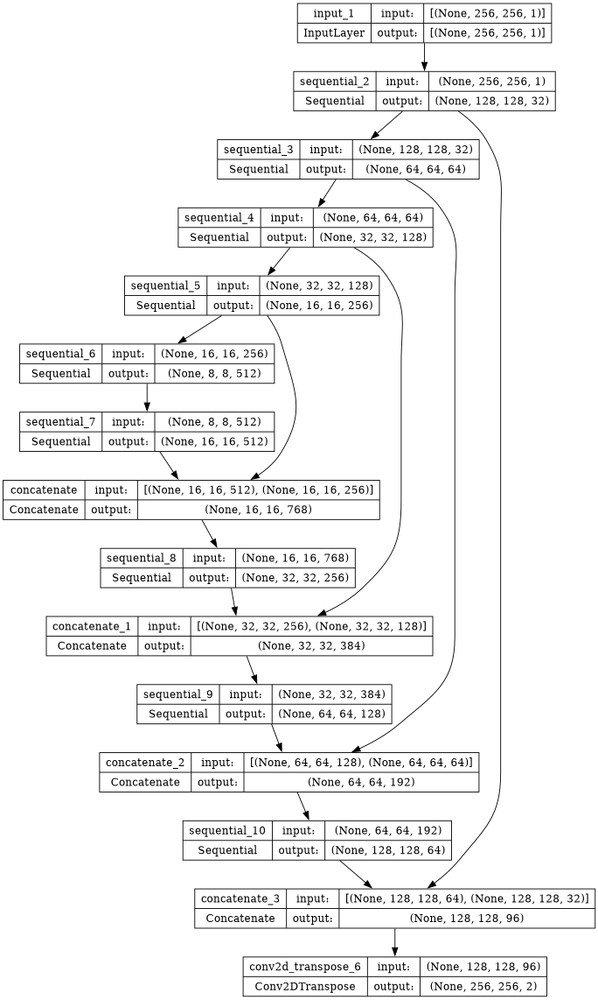

In [29]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [30]:
# gen.load_weights('/kaggle/input/feb28-coco/modelsFeb7/gen_weight.keras')

In [31]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

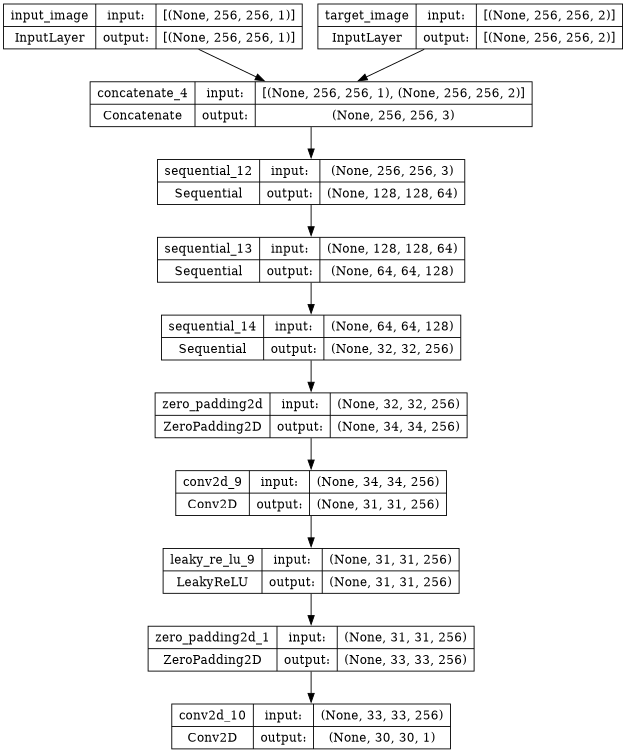

In [32]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [33]:
# disc.load_weights('/kaggle/input/feb28-coco/modelsFeb7/disc_wweight.keras')

In [34]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [35]:
LAMBDA = 150

In [36]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [37]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 150*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [38]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [39]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [40]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [41]:
epochs = 250

In [42]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [43]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [44]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [45]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [46]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [47]:
os.mkdir('/kaggle/working/gen_output/')

In [48]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [49]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image,256)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


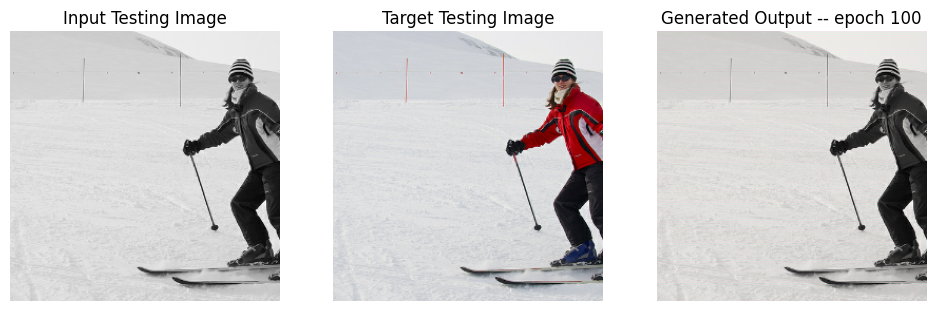

SSIM Score: 0.8331077694892883
PSNR Score: 25.730228424072266


In [50]:
display_random_test_image(gen, '/kaggle/input/coco-2017-dataset/coco2017/val2017/000000000785.jpg',100)

In [51]:
os.mkdir('/kaggle/working/modelsFeb7')

In [52]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        gen.save('/kaggle/working/modelsFeb7/gen.h5')
        gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
        disc.save('/kaggle/working/modelsFeb7/disc.h5')
        disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')
        if time.time() - time_start > 41000:
            stop_training = True
#         if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
        display_random_test_image(gen, '/kaggle/input/coco-2017-dataset/coco2017/val2017/000000000785.jpg', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [53]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 1s 0us/step
Training Details
Generator-- total_loss:11.74746 gan_loss:1.52700 l1_loss:0.05664 perceptual_loss:0.01150 Discriminator-- total_loss:1.11185 real_loss:0.53985 generated_loss:0.57201 --- SSIM 0.83570 PSNR 21.13841 LPIPS 0.00000
Time taken for epoch 1 is 2437.7496073246 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:19.80360 gan_loss:0.80157 l1_loss:0.11434  perceptual_loss:0.01234 Discriminator-- total_loss:1.70747 real_loss:0.69156 generated_loss:1.01591 --- SSIM 0.75939 PSNR 15.72217 LPIPS 0.00000
Time taken for epoch 1 is 2481.4486651420593 sec
Number of iteration 63


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Displaying one random test image...


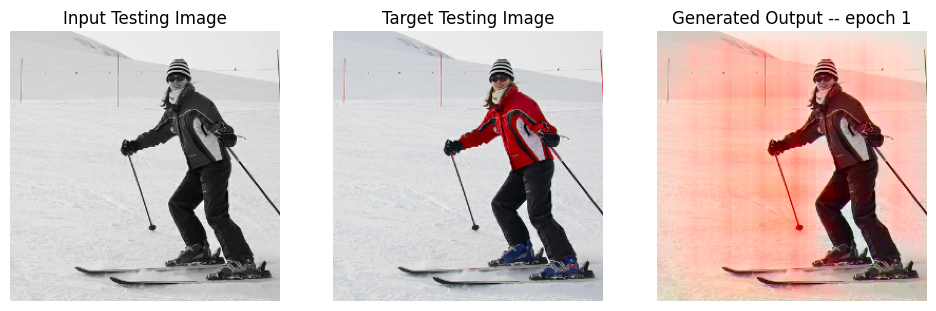

SSIM Score: 0.8065173625946045
PSNR Score: 15.197047233581543
Epoch 1
Training Details
Generator-- total_loss:11.25887 gan_loss:1.30416 l1_loss:0.05531 perceptual_loss:0.01105 Discriminator-- total_loss:1.15260 real_loss:0.55570 generated_loss:0.59691 --- SSIM 0.84682 PSNR 21.08968 LPIPS 0.00000
Time taken for epoch 2 is 2397.7588787078857 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:14.88724 gan_loss:1.69334 l1_loss:0.07591  perceptual_loss:0.01205 Discriminator-- total_loss:1.19410 real_loss:0.43777 generated_loss:0.75633 --- SSIM 0.83364 PSNR 17.47673 LPIPS 0.00000
Time taken for epoch 2 is 2439.2055089473724 sec
Number of iteration 63
Displaying one random test image...


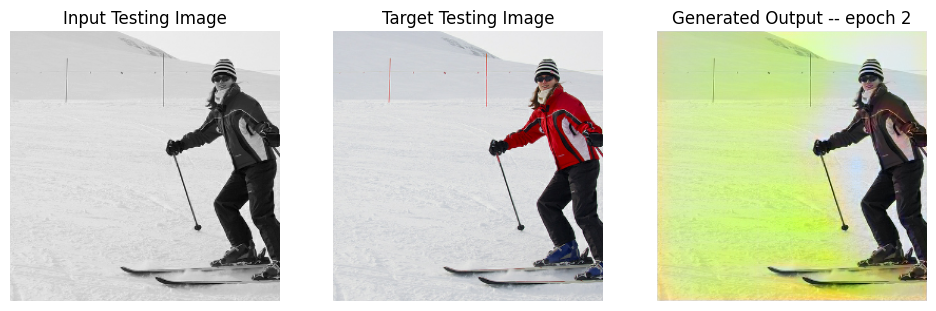

SSIM Score: 0.8996699452400208
PSNR Score: 15.934053421020508
Epoch 2
Training Details
Generator-- total_loss:10.96967 gan_loss:1.24615 l1_loss:0.05397 perceptual_loss:0.01086 Discriminator-- total_loss:1.14547 real_loss:0.54746 generated_loss:0.59802 --- SSIM 0.85212 PSNR 21.24124 LPIPS 0.00000
Time taken for epoch 3 is 2428.95019030571 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.97784 gan_loss:0.31701 l1_loss:0.04808  perceptual_loss:0.00966 Discriminator-- total_loss:1.92996 real_loss:1.68582 generated_loss:0.24414 --- SSIM 0.90166 PSNR 22.23783 LPIPS 0.00000
Time taken for epoch 3 is 2469.9154665470123 sec
Number of iteration 63
Displaying one random test image...


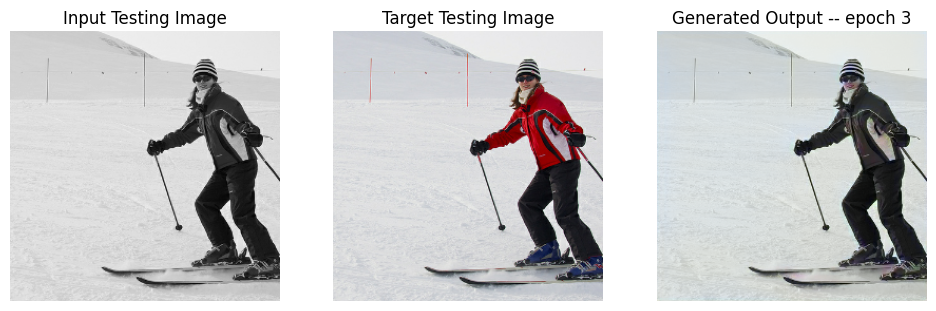

SSIM Score: 0.9546694159507751
PSNR Score: 25.751422882080078
Epoch 3
Training Details
Generator-- total_loss:10.90319 gan_loss:1.24598 l1_loss:0.05372 perceptual_loss:0.01066 Discriminator-- total_loss:1.13513 real_loss:0.53566 generated_loss:0.59947 --- SSIM 0.85078 PSNR 21.25985 LPIPS 0.00000
Time taken for epoch 4 is 2421.5556874275208 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.93841 gan_loss:0.46212 l1_loss:0.04675  perceptual_loss:0.00976 Discriminator-- total_loss:1.44627 real_loss:1.06789 generated_loss:0.37838 --- SSIM 0.91051 PSNR 22.55624 LPIPS 0.00000
Time taken for epoch 4 is 2462.9692857265472 sec
Number of iteration 63
Displaying one random test image...


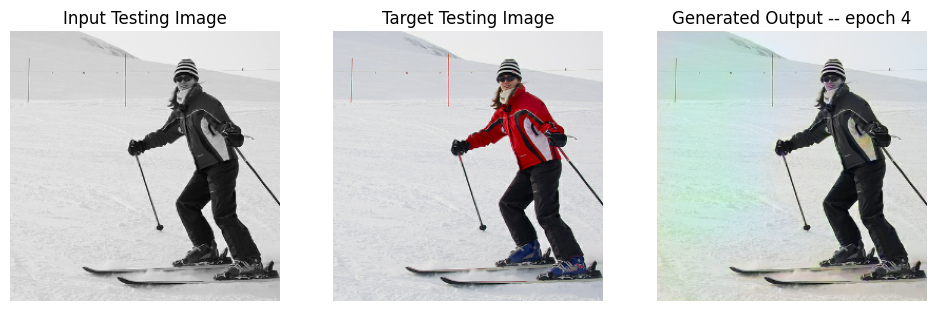

SSIM Score: 0.9507620930671692
PSNR Score: 24.545103073120117
Epoch 4
Training Details
Generator-- total_loss:10.82175 gan_loss:1.24673 l1_loss:0.05325 perceptual_loss:0.01058 Discriminator-- total_loss:1.12891 real_loss:0.53529 generated_loss:0.59362 --- SSIM 0.84974 PSNR 21.36156 LPIPS 0.00000
Time taken for epoch 5 is 2426.602484226227 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:9.24298 gan_loss:0.40869 l1_loss:0.04906  perceptual_loss:0.00984 Discriminator-- total_loss:1.74302 real_loss:1.34659 generated_loss:0.39643 --- SSIM 0.89671 PSNR 21.98236 LPIPS 0.00000
Time taken for epoch 5 is 2467.185835838318 sec
Number of iteration 63
Displaying one random test image...


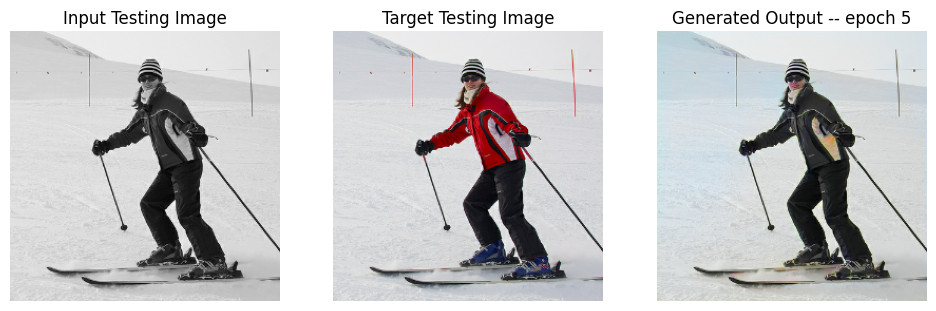

SSIM Score: 0.9519049525260925
PSNR Score: 25.273927688598633
Epoch 5
Training Details
Generator-- total_loss:10.84440 gan_loss:1.25188 l1_loss:0.05330 perceptual_loss:0.01065 Discriminator-- total_loss:1.10381 real_loss:0.52138 generated_loss:0.58243 --- SSIM 0.84843 PSNR 21.36134 LPIPS 0.00000
Time taken for epoch 6 is 2438.918702363968 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:12.59260 gan_loss:2.92748 l1_loss:0.05380  perceptual_loss:0.01063 Discriminator-- total_loss:3.04234 real_loss:0.10984 generated_loss:2.93250 --- SSIM 0.87974 PSNR 21.07683 LPIPS 0.00000
Time taken for epoch 6 is 2479.829966545105 sec
Number of iteration 63
Displaying one random test image...


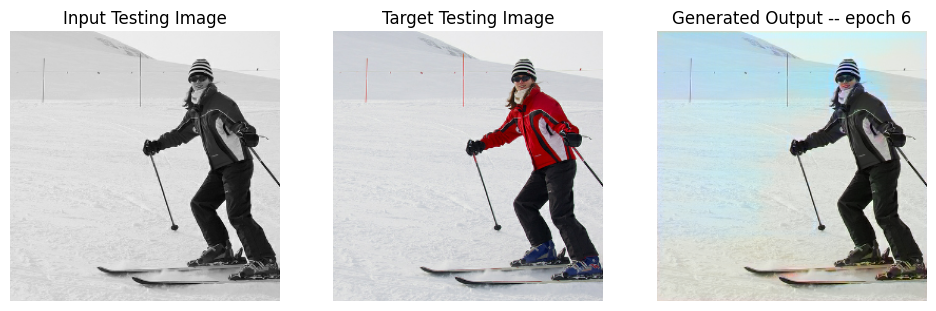

SSIM Score: 0.9386772513389587
PSNR Score: 23.716419219970703
Epoch 6
Training Details
Generator-- total_loss:10.86038 gan_loss:1.26439 l1_loss:0.05329 perceptual_loss:0.01068 Discriminator-- total_loss:1.09758 real_loss:0.51726 generated_loss:0.58032 --- SSIM 0.84714 PSNR 21.34638 LPIPS 0.00000
Time taken for epoch 7 is 2435.4781720638275 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:10.19825 gan_loss:1.51199 l1_loss:0.04806  perceptual_loss:0.00985 Discriminator-- total_loss:1.56872 real_loss:0.38124 generated_loss:1.18748 --- SSIM 0.89890 PSNR 22.08309 LPIPS 0.00000
Time taken for epoch 7 is 2475.4038043022156 sec
Number of iteration 63
Displaying one random test image...


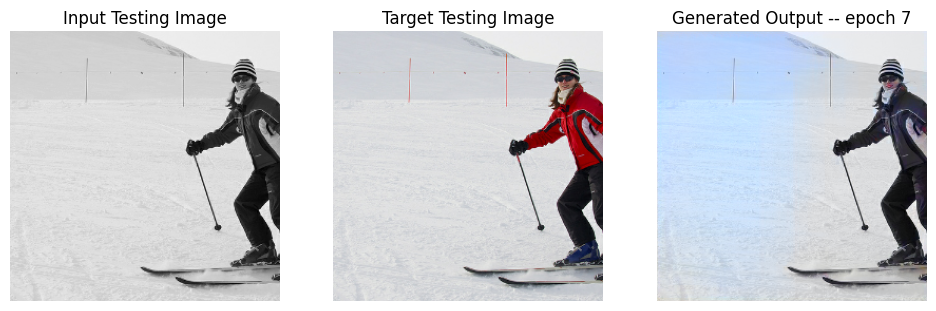

SSIM Score: 0.9502931237220764
PSNR Score: 22.525657653808594
Epoch 7
Training Details
Generator-- total_loss:10.90403 gan_loss:1.28205 l1_loss:0.05344 perceptual_loss:0.01070 Discriminator-- total_loss:1.08581 real_loss:0.51466 generated_loss:0.57115 --- SSIM 0.84501 PSNR 21.33027 LPIPS 0.00000
Time taken for epoch 8 is 2418.0977199077606 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:11.37535 gan_loss:1.13716 l1_loss:0.05768  perceptual_loss:0.01057 Discriminator-- total_loss:1.37716 real_loss:0.57941 generated_loss:0.79774 --- SSIM 0.86891 PSNR 20.53032 LPIPS 0.00000
Time taken for epoch 8 is 2458.6943922042847 sec
Number of iteration 63
Displaying one random test image...


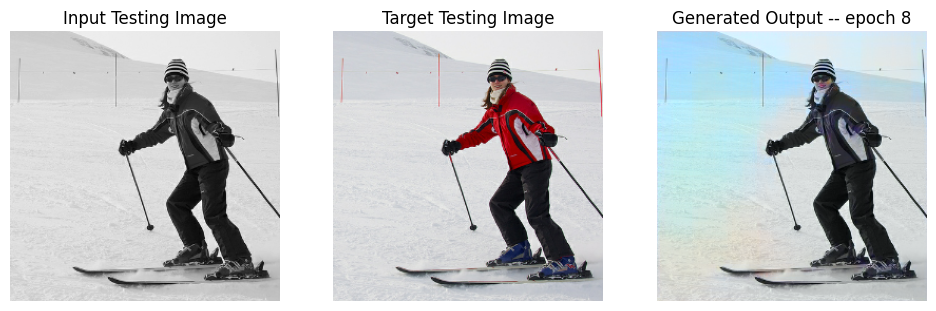

SSIM Score: 0.94021075963974
PSNR Score: 22.464733123779297
Epoch 8
Training Details
Generator-- total_loss:10.92020 gan_loss:1.31688 l1_loss:0.05324 perceptual_loss:0.01078 Discriminator-- total_loss:1.06835 real_loss:0.50264 generated_loss:0.56571 --- SSIM 0.84601 PSNR 21.34956 LPIPS 0.00000
Time taken for epoch 9 is 2414.639024734497 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:27.70417 gan_loss:0.58336 l1_loss:0.16705  perceptual_loss:0.01375 Discriminator-- total_loss:2.30459 real_loss:1.40061 generated_loss:0.90398 --- SSIM 0.63672 PSNR 12.76928 LPIPS 0.00000
Time taken for epoch 9 is 2454.9485268592834 sec
Number of iteration 63
Displaying one random test image...


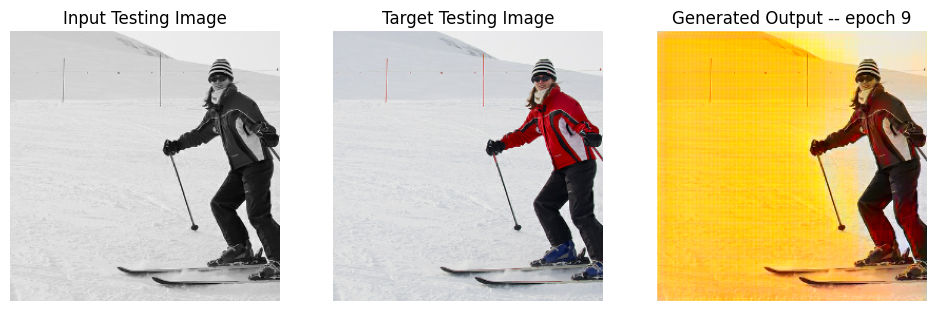

SSIM Score: 0.5942626595497131
PSNR Score: 8.300869941711426
Epoch 9
Training Details
Generator-- total_loss:9.61331 gan_loss:1.05424 l1_loss:0.04632 perceptual_loss:0.01074 Discriminator-- total_loss:1.23612 real_loss:0.58677 generated_loss:0.64934 --- SSIM 0.87611 PSNR 22.77700 LPIPS 0.00000
Time taken for epoch 10 is 2169.541248559952 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:9.37655 gan_loss:0.75060 l1_loss:0.04654  perceptual_loss:0.01097 Discriminator-- total_loss:1.95472 real_loss:0.72828 generated_loss:1.22644 --- SSIM 0.90582 PSNR 22.62841 LPIPS 0.00000
Time taken for epoch 10 is 2210.32573223114 sec
Number of iteration 63
Displaying one random test image...


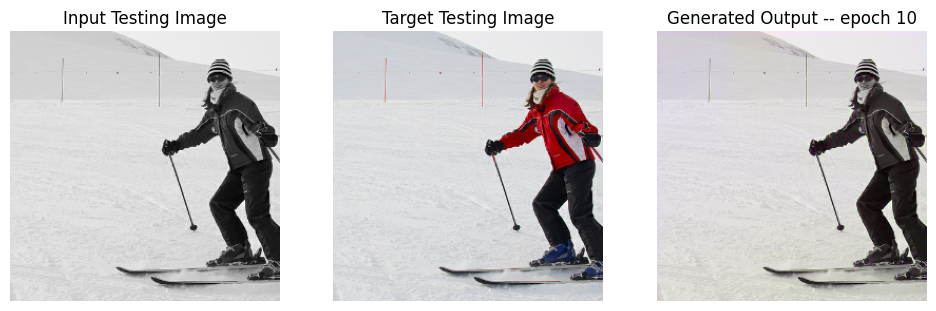

SSIM Score: 0.9520464539527893
PSNR Score: 25.948516845703125
Epoch 10
Training Details
Generator-- total_loss:9.28871 gan_loss:0.77177 l1_loss:0.04634 perceptual_loss:0.01044 Discriminator-- total_loss:1.51350 real_loss:0.86606 generated_loss:0.64744 --- SSIM 0.87273 PSNR 22.89443 LPIPS 0.00000
Time taken for epoch 11 is 2166.531261444092 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:9.07571 gan_loss:0.48574 l1_loss:0.04701  perceptual_loss:0.01026 Discriminator-- total_loss:2.51994 real_loss:1.12190 generated_loss:1.39804 --- SSIM 0.89862 PSNR 22.70570 LPIPS 0.00000
Time taken for epoch 11 is 2207.818050146103 sec
Number of iteration 63
Displaying one random test image...


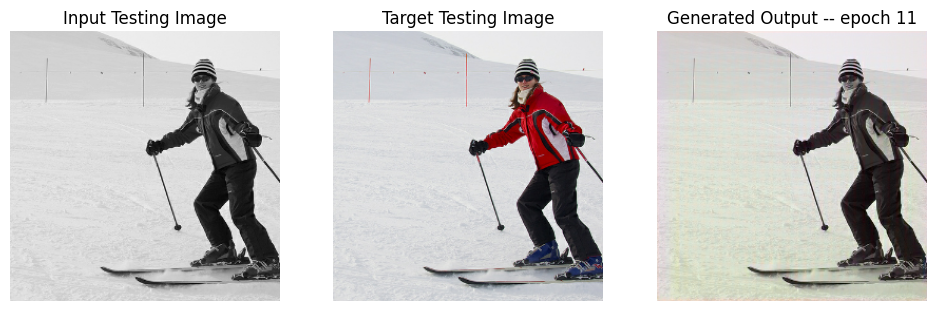

SSIM Score: 0.9275643229484558
PSNR Score: 25.154457092285156
Epoch 11
Training Details
Generator-- total_loss:19.24825 gan_loss:10.67290 l1_loss:0.04678 perceptual_loss:0.01039 Discriminator-- total_loss:0.06281 real_loss:0.03568 generated_loss:0.02712 --- SSIM 0.86792 PSNR 22.95898 LPIPS 0.00000
Time taken for epoch 12 is 1620.731600522995 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.38102 gan_loss:0.01451 l1_loss:0.04583  perceptual_loss:0.00994 Discriminator-- total_loss:5.88044 real_loss:5.87761 generated_loss:0.00283 --- SSIM 0.90206 PSNR 22.89440 LPIPS 0.00000
Time taken for epoch 12 is 1661.7034995555878 sec
Number of iteration 63
Displaying one random test image...


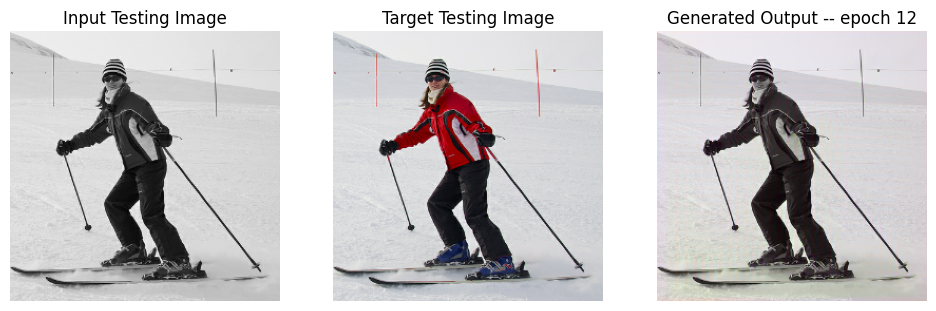

SSIM Score: 0.9321608543395996
PSNR Score: 25.6968994140625
Epoch 12
Training Details
Generator-- total_loss:22.49921 gan_loss:13.93983 l1_loss:0.04669 perceptual_loss:0.01037 Discriminator-- total_loss:0.00011 real_loss:0.00004 generated_loss:0.00006 --- SSIM 0.86824 PSNR 22.99194 LPIPS 0.00000
Time taken for epoch 13 is 1632.5095438957214 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.32079 gan_loss:0.00503 l1_loss:0.04548  perceptual_loss:0.00996 Discriminator-- total_loss:7.50108 real_loss:7.50021 generated_loss:0.00087 --- SSIM 0.90250 PSNR 23.05670 LPIPS 0.00000
Time taken for epoch 13 is 1673.9777998924255 sec
Number of iteration 63
Displaying one random test image...


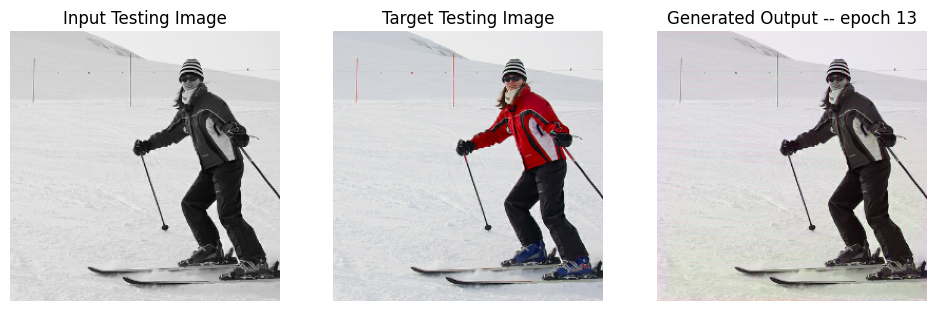

SSIM Score: 0.9342852234840393
PSNR Score: 25.756502151489258
Epoch 13
Training Details
Generator-- total_loss:24.20493 gan_loss:15.58228 l1_loss:0.04707 perceptual_loss:0.01042 Discriminator-- total_loss:0.00003 real_loss:0.00001 generated_loss:0.00002 --- SSIM 0.86738 PSNR 22.91704 LPIPS 0.00000
Time taken for epoch 14 is 1617.9920239448547 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.49492 gan_loss:0.00472 l1_loss:0.04629  perceptual_loss:0.01031 Discriminator-- total_loss:8.16116 real_loss:8.16054 generated_loss:0.00062 --- SSIM 0.90182 PSNR 22.95717 LPIPS 0.00000
Time taken for epoch 14 is 1660.9697272777557 sec
Number of iteration 63
Displaying one random test image...


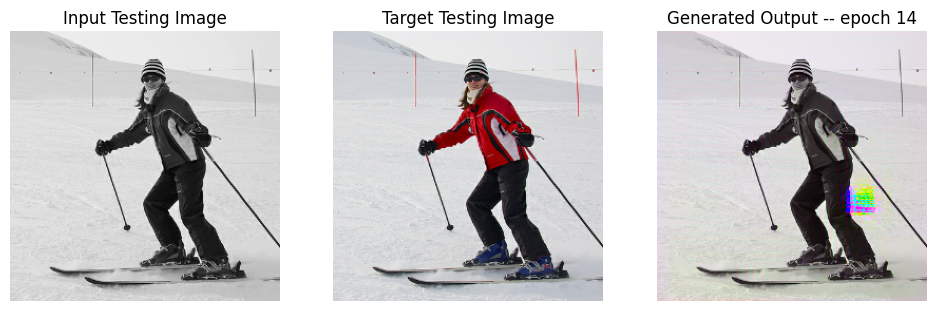

SSIM Score: 0.9113891124725342
PSNR Score: 20.090618133544922
Epoch 14
Training Details
Generator-- total_loss:25.88718 gan_loss:17.32730 l1_loss:0.04673 perceptual_loss:0.01034 Discriminator-- total_loss:0.00001 real_loss:0.00000 generated_loss:0.00001 --- SSIM 0.86758 PSNR 22.97825 LPIPS 0.00000
Time taken for epoch 15 is 1610.072794675827 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.40172 gan_loss:0.00148 l1_loss:0.04588  perceptual_loss:0.01012 Discriminator-- total_loss:10.01559 real_loss:10.01534 generated_loss:0.00025 --- SSIM 0.90271 PSNR 22.94499 LPIPS 0.00000
Time taken for epoch 15 is 1651.1060245037079 sec
Number of iteration 63
Displaying one random test image...


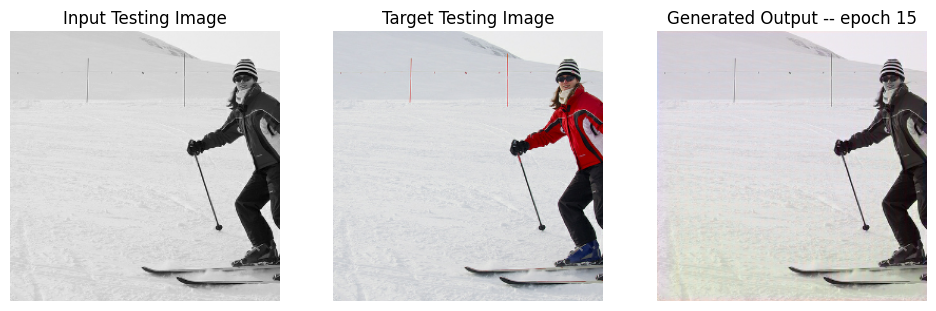

SSIM Score: 0.9388325810432434
PSNR Score: 26.27398681640625
Epoch 15
Training Details
Generator-- total_loss:28.28557 gan_loss:19.69028 l1_loss:0.04686 perceptual_loss:0.01044 Discriminator-- total_loss:0.00000 real_loss:0.00000 generated_loss:0.00000 --- SSIM 0.86791 PSNR 22.94230 LPIPS 0.00000
Time taken for epoch 16 is 1632.815707206726 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.49913 gan_loss:0.00631 l1_loss:0.04627  perceptual_loss:0.01035 Discriminator-- total_loss:10.41811 real_loss:10.41789 generated_loss:0.00023 --- SSIM 0.89933 PSNR 22.94120 LPIPS 0.00000
Time taken for epoch 16 is 1674.292260169983 sec
Number of iteration 63
Displaying one random test image...


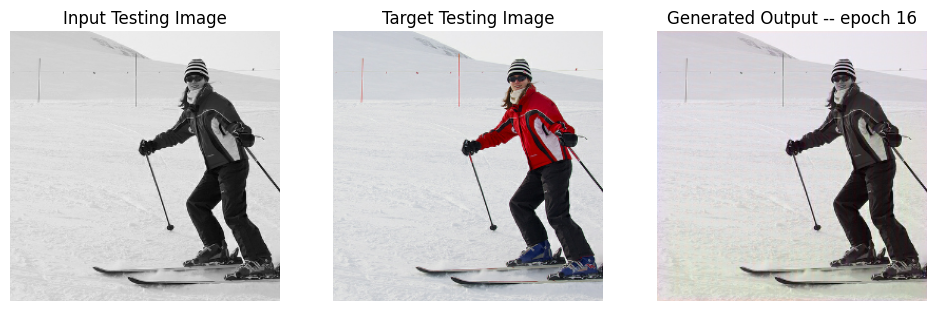

SSIM Score: 0.9346945881843567
PSNR Score: 25.766002655029297
Epoch 16
Training Details
Generator-- total_loss:28.87688 gan_loss:20.27289 l1_loss:0.04695 perceptual_loss:0.01041 Discriminator-- total_loss:0.23108 real_loss:0.11282 generated_loss:0.11827 --- SSIM 0.86701 PSNR 22.91718 LPIPS 0.00000
Time taken for epoch 17 is 1645.534581899643 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.77252 gan_loss:0.25094 l1_loss:0.04663  perceptual_loss:0.01018 Discriminator-- total_loss:3.88742 real_loss:3.82327 generated_loss:0.06415 --- SSIM 0.90189 PSNR 22.85752 LPIPS 0.00000
Time taken for epoch 17 is 1687.4256060123444 sec
Number of iteration 63
Displaying one random test image...


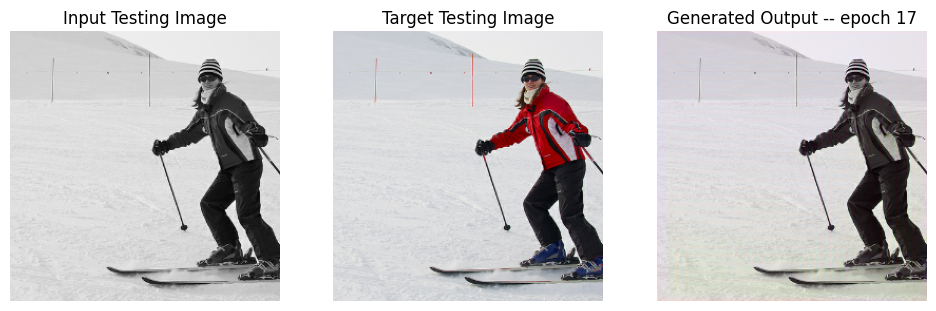

SSIM Score: 0.9359217286109924
PSNR Score: 25.805530548095703
Epoch 17
Training Details
Generator-- total_loss:18.34363 gan_loss:9.76433 l1_loss:0.04685 perceptual_loss:0.01034 Discriminator-- total_loss:0.00222 real_loss:0.00108 generated_loss:0.00114 --- SSIM 0.86733 PSNR 22.95487 LPIPS 0.00000
Time taken for epoch 18 is 1633.9337704181671 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.52920 gan_loss:0.03521 l1_loss:0.04631  perceptual_loss:0.01032 Discriminator-- total_loss:8.02317 real_loss:8.01242 generated_loss:0.01075 --- SSIM 0.90063 PSNR 22.86919 LPIPS 0.00000
Time taken for epoch 18 is 1675.419427871704 sec
Number of iteration 63
Displaying one random test image...


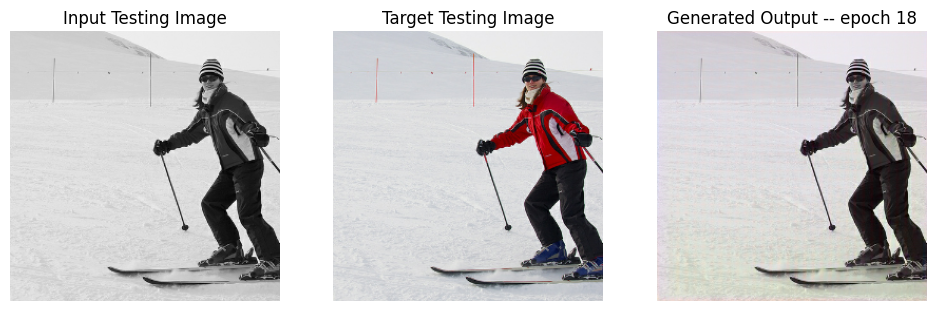

SSIM Score: 0.934894859790802
PSNR Score: 25.79729461669922
Epoch 18
Training Details
Generator-- total_loss:21.48586 gan_loss:12.87455 l1_loss:0.04703 perceptual_loss:0.01038 Discriminator-- total_loss:0.00018 real_loss:0.00009 generated_loss:0.00009 --- SSIM 0.86777 PSNR 22.93706 LPIPS 0.00000
Time taken for epoch 19 is 1647.7275230884552 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.37226 gan_loss:0.01513 l1_loss:0.04567  perceptual_loss:0.01004 Discriminator-- total_loss:10.40175 real_loss:10.39587 generated_loss:0.00588 --- SSIM 0.90157 PSNR 23.03551 LPIPS 0.00000
Time taken for epoch 19 is 1689.6064450740814 sec
Number of iteration 63
Displaying one random test image...


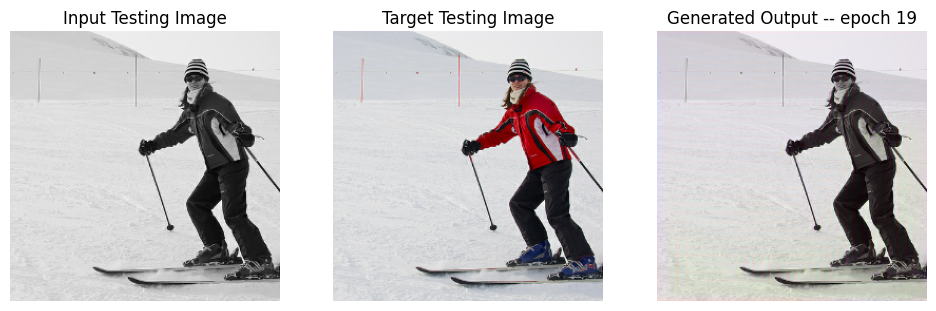

SSIM Score: 0.9347753524780273
PSNR Score: 25.777080535888672
Epoch 19
Training Details
Generator-- total_loss:23.65778 gan_loss:15.11691 l1_loss:0.04658 perceptual_loss:0.01036 Discriminator-- total_loss:0.00004 real_loss:0.00002 generated_loss:0.00002 --- SSIM 0.86892 PSNR 22.99506 LPIPS 0.00000
Time taken for epoch 20 is 1636.8849523067474 sec
Number of iteration 2000
Validation Details
Generator-- total_loss:8.47634 gan_loss:0.00944 l1_loss:0.04636  perceptual_loss:0.01008 Discriminator-- total_loss:10.93696 real_loss:10.93321 generated_loss:0.00374 --- SSIM 0.90316 PSNR 22.91666 LPIPS 0.00000
Time taken for epoch 20 is 1678.888278722763 sec
Number of iteration 63
Displaying one random test image...


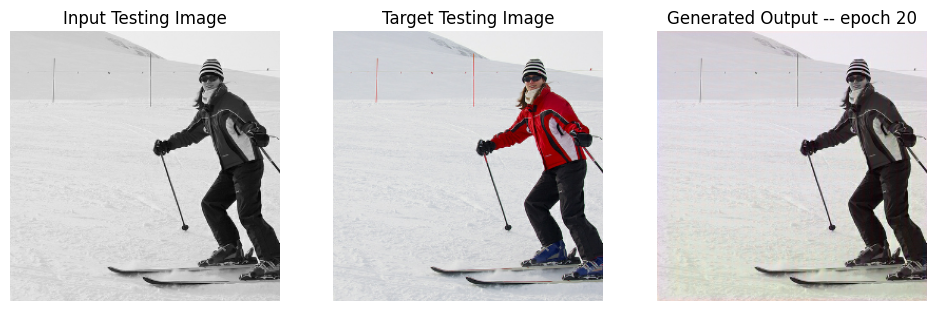

SSIM Score: 0.9340879917144775
PSNR Score: 25.7742862701416


In [54]:
fit(train_dataset, epochs, val, gen)

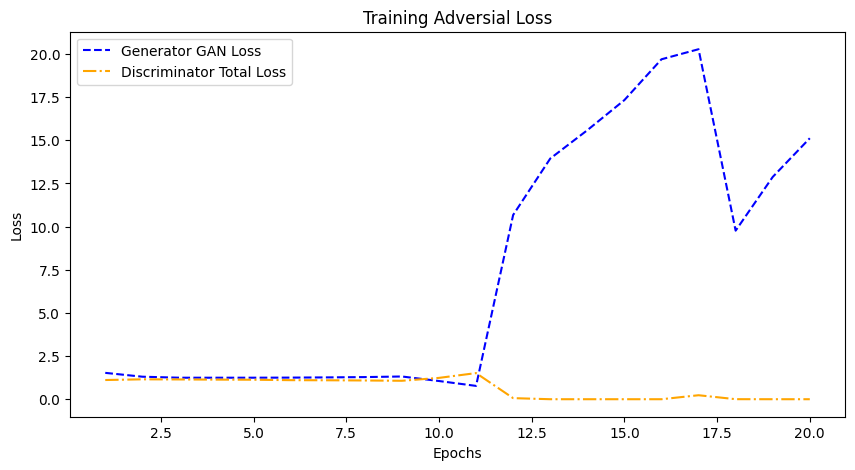

In [55]:
epochs = range(1, len(train_generator_losses) + 1)
plt.figure(figsize=(10, 5))
plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator GAN Loss')
plt.plot(epochs, train_discriminator_losses, '-.', color='orange', label='Discriminator Total Loss')
plt.title('Training Adversial Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

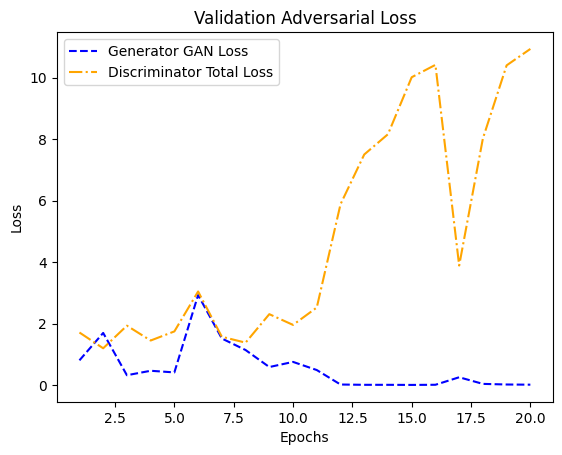

In [56]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator GAN Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Discriminator Total Loss')
plt.title('Validation Adversarial Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

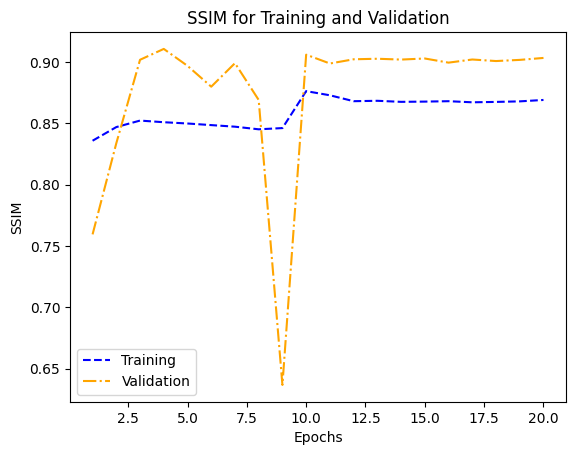

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training')
plt.plot(epochs, testing_ssim, '-.', color='orange', label='Validation')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

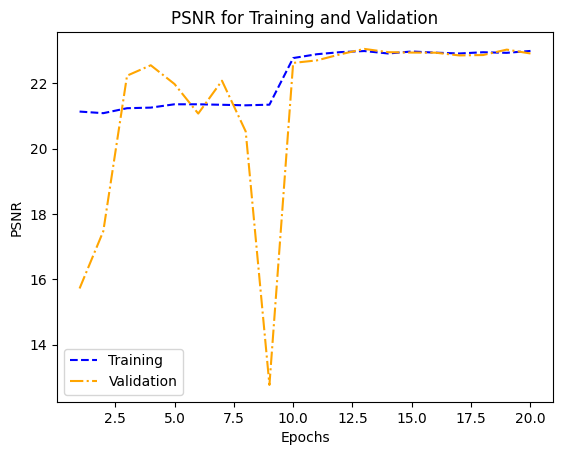

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training')
plt.plot(epochs, testing_psnr, '-.', color='orange', label='Validation')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

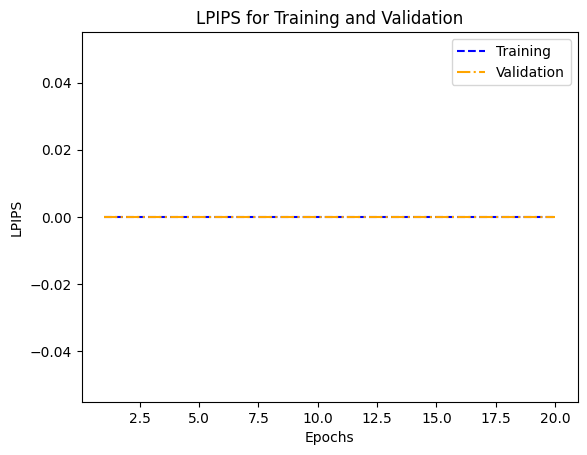

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training')
plt.plot(epochs, testing_lpips, '-.', color='orange', label='Validation')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

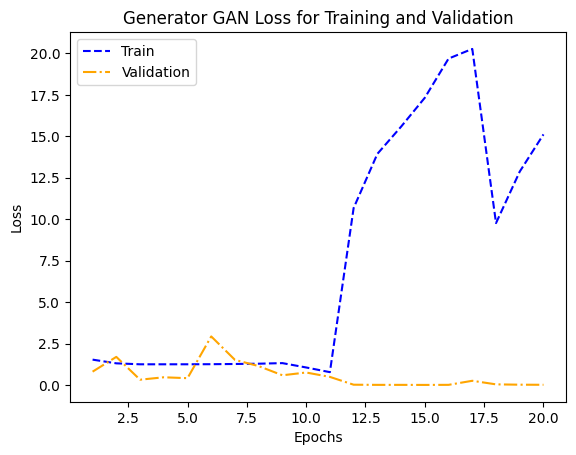

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train')
plt.plot(epochs, test_generator_gan_losses,'-.', color='orange', label='Validation')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

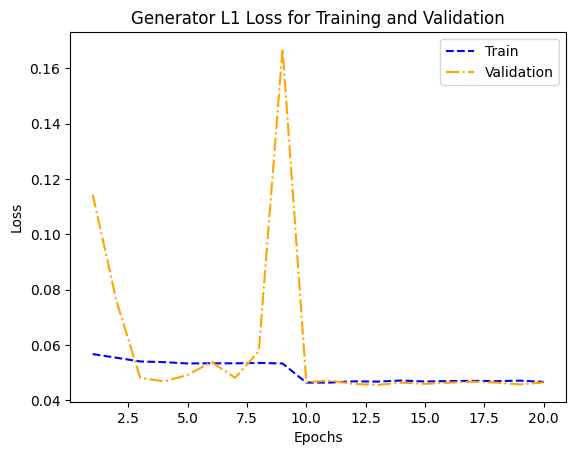

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train')
plt.plot(epochs, test_generator_l1_losses, '-.', color='orange', label='Validation')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

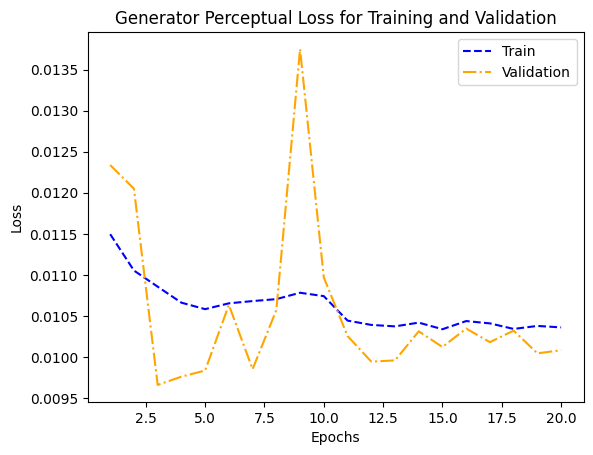

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train')
plt.plot(epochs, test_generator_perceptual_losses, '-.', color='orange', label='Validation')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

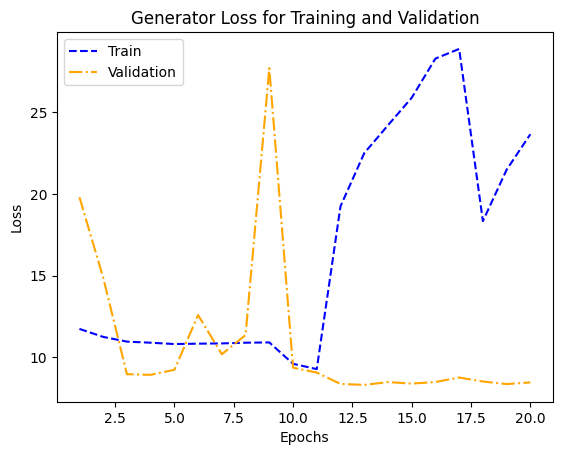

In [63]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train')
plt.plot(epochs, test_generator_losses, '-.', color='orange', label='Validation')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

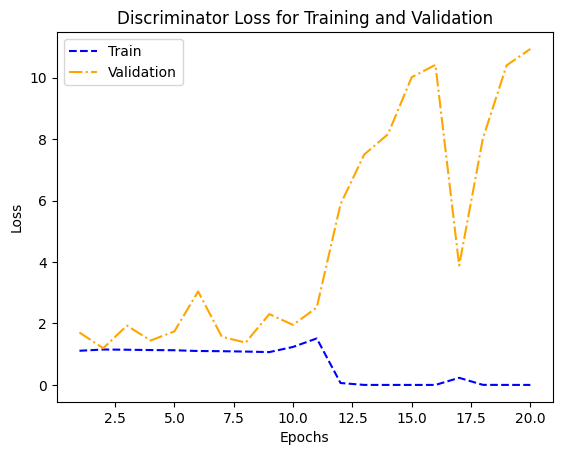

In [64]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Validation')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

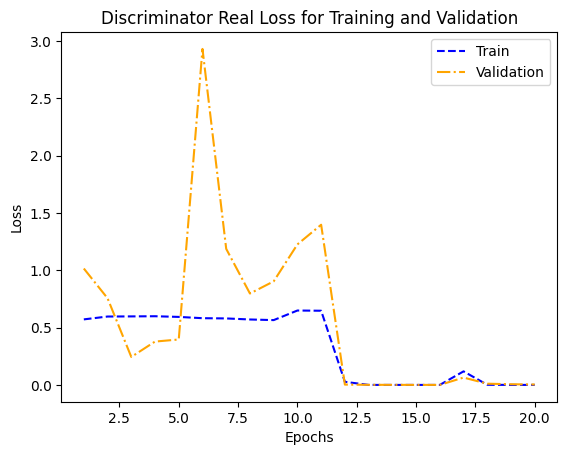

In [65]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_real_losses, '-.', color='orange', label='Validation')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

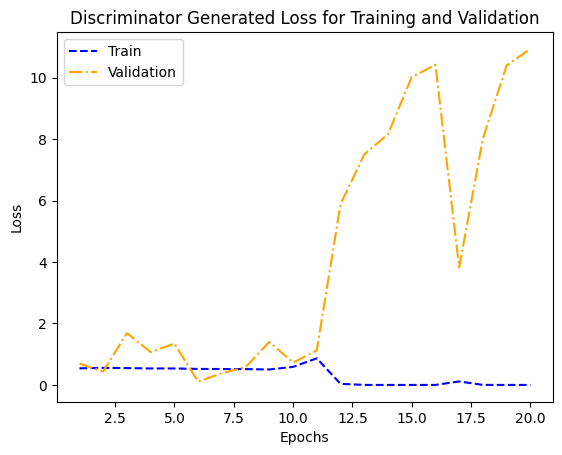

In [66]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train')
plt.plot(epochs, test_discriminator_generated_losses,'-.', color='orange', label='Validation')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [67]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [68]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [69]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [70]:
import subprocess
from IPython.display import FileLink, display

In [71]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip